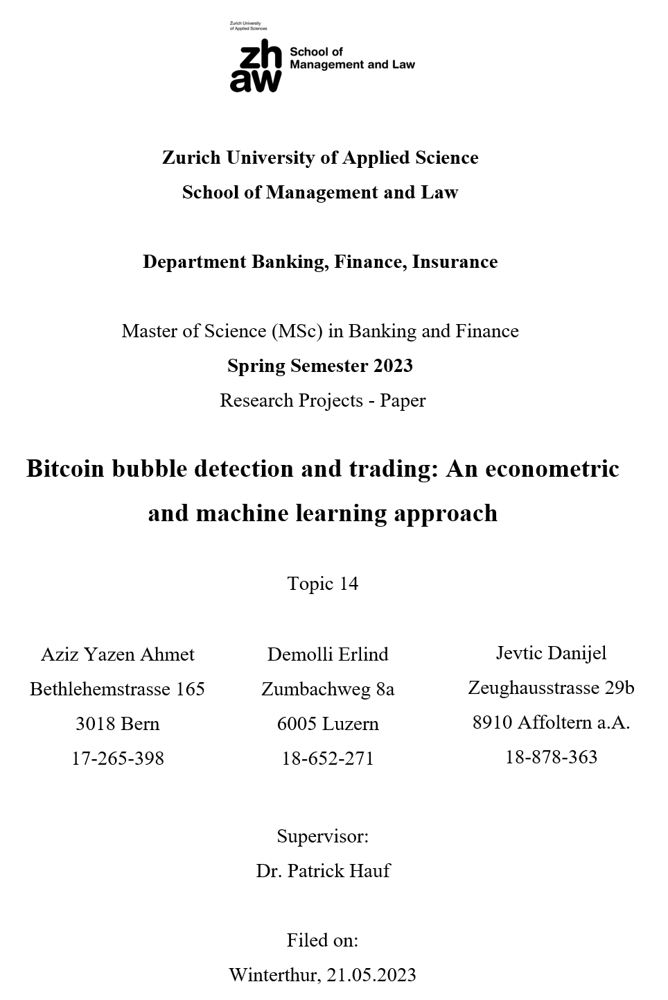

In [75]:
# Basic Imports
import numpy as np
import pandas as pd
from matplotlib import pyplot
import yfinance as yf
import random

#LPPLS Model library 
from lppls import lppls, data_loader
from datetime import datetime as dt

#Import Plott Libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import matplotlib.dates as mdates
from pandas.plotting import register_matplotlib_converters

# Register matplotlib converters.
register_matplotlib_converters()

# Set the style of Seaborn
sns.set_style("darkgrid")


#plot size
plt.rcParams['figure.figsize'] = (20, 10)

# Machine Learning Imports
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import RocCurveDisplay, roc_auc_score
from sklearn.metrics import accuracy_score, classification_report
from sklearn.inspection import permutation_importance
from tabulate import tabulate
import xgboost as xgb
from sklearn.model_selection import KFold
from imblearn.over_sampling import ADASYN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score

### Functions

In [2]:
#xgb
def mae_metric(actual, predicted):
    """
    Calculate the mae.
    """
    if isinstance(actual, pd.DataFrame) or isinstance(actual, pd.Series):
        actual = actual.to_numpy().flatten()
    if isinstance(predicted, pd.DataFrame) or isinstance(predicted, pd.Series):
        predicted = predicted.to_numpy().flatten()

    sum_error = 0.0
    for i in range(len(actual)):
        prediction_error = abs(predicted[i] - actual[i])
        sum_error += prediction_error
    mean_error = sum_error / float(len(actual))
    return mean_error



def rmse_metric(actual, predicted):
    """
    Calculate the rmse.
    """
    if isinstance(actual, pd.DataFrame) or isinstance(actual, pd.Series):
        actual = actual.to_numpy().flatten()
    if isinstance(predicted, pd.DataFrame) or isinstance(predicted, pd.Series):
        predicted = predicted.to_numpy().flatten()

    sum_error = 0.0
    for i in range(len(actual)):
        prediction_error = predicted[i] - actual[i]
        sum_error += (prediction_error ** 2)
    mean_error = sum_error / float(len(actual))
    return np.sqrt(mean_error)


def max_drawdown(returns):
    """
    Calculate the maximum drawdown.
    """
    cum_returns = (1 + np.array(returns)).cumprod()
    max_returns = np.maximum.accumulate(cum_returns)
    drawdowns = 1 - cum_returns / max_returns

    return np.max(drawdowns)

# 1. Load Label / Features 

In [77]:
features = pd.read_csv('model_features.csv')
features['vix_change'] =features['vix'].pct_change()
features = features.dropna()
features

,Date,Close,Log_Returns,RSI,K_percent,MACD,ROC,btc_no_transactions_change,GEPUPPP,vix,...,fed_fund_eff_rate,volume_mined_sum_pct_change,hash_rate_mean_pct_change,Nom_Broad_USD_Index_inter_change,Volume_change,SP_GSCI_Energy_Tot_Ret,SP_GSCI_Gold_Tot_Ret,SP_Global_BMI_Tot_Ret,Pred_Signal,vix_change
1,2015-07-03,256.335999,0.003611,62.511035,58.072117,5.770135,0.065780,-0.065499,128.857764,16.845,...,0.13,0.045455,0.037984,5.231006e-04,-0.116839,0.000000,0.000000,-0.002245,0.0,0.003276
2,2015-07-04,260.885986,0.017594,68.617634,74.616325,6.052054,0.074494,-0.215890,128.857764,16.900,...,0.13,-0.055901,-0.045281,5.228271e-04,-0.179334,-0.024780,0.002781,-0.003386,0.0,0.003265
3,2015-07-05,271.912994,0.041399,78.320490,92.404976,7.083609,0.116255,0.491840,128.857764,16.955,...,0.13,-0.065789,-0.083265,5.225539e-04,1.826823,-0.025410,0.002773,-0.003398,0.0,0.003254
4,2015-07-06,269.029999,-0.010659,71.887372,77.353806,7.581100,0.071875,0.147152,128.857764,17.010,...,0.13,0.274648,0.278871,5.222810e-04,0.113205,-0.026072,0.002765,-0.003409,0.0,0.003244
5,2015-07-07,266.207001,-0.010549,65.722761,69.735815,7.659281,0.069057,0.151376,128.857764,16.090,...,0.13,-0.259669,-0.255988,6.073685e-03,-0.412924,-0.002375,-0.017555,-0.004059,0.0,-0.054086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,2023-03-05,22435.513672,0.003669,35.359579,8.078675,1.142890,-0.032874,-0.064192,264.330834,18.570,...,4.57,0.019737,0.024760,-7.126669e-04,0.192637,-0.000518,0.000133,0.000680,0.0,0.002159
2804,2023-03-06,22429.757812,-0.000257,35.267357,7.882087,-52.088259,-0.032173,0.102492,264.330834,18.610,...,4.57,-0.148387,-0.169201,-7.131752e-04,0.303086,-0.000518,0.000133,0.000680,0.0,0.002154
2805,2023-03-07,22219.769531,-0.009406,31.777620,8.142203,-109.951179,-0.056934,0.145771,264.330834,19.590,...,4.57,0.250000,0.250673,7.807129e-03,0.311888,-0.030179,-0.018524,-0.013115,0.0,0.052660
2806,2023-03-08,21718.080078,-0.022837,24.916690,0.350180,-194.053181,-0.076725,-0.192191,264.330834,19.110,...,4.57,-0.193939,-0.176546,-4.772233e-05,-0.010054,-0.012230,-0.000613,-0.000756,0.0,-0.024502


In [78]:
btc_close = features['Close'] # for plotting
date = features['Date'] #to get the x axis dates
btc_close.index = date

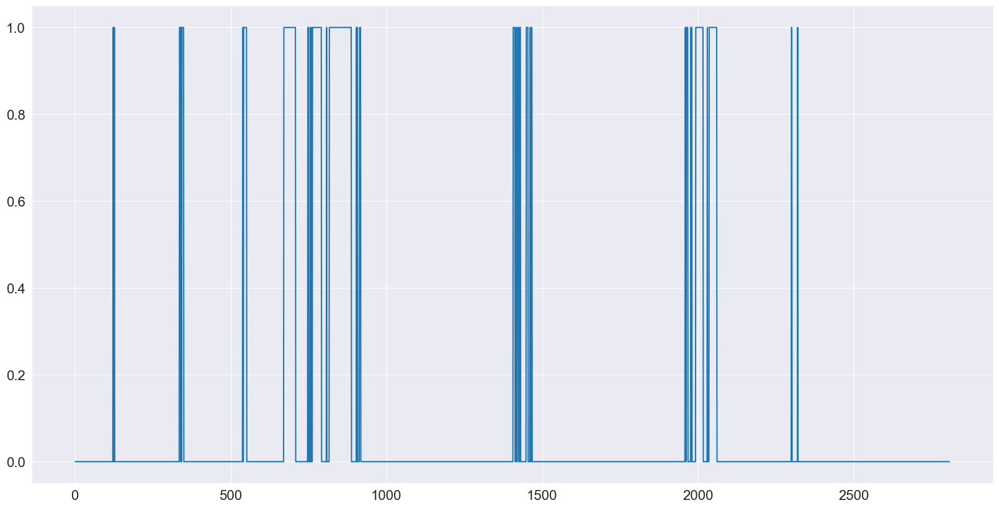

In [91]:
#create label
label = features['Pred_Signal']
plt.plot(label)

In [6]:
features = features.drop(['Close','Date','Pred_Signal'],axis = 1)


# 2. Building the LPPLS Model

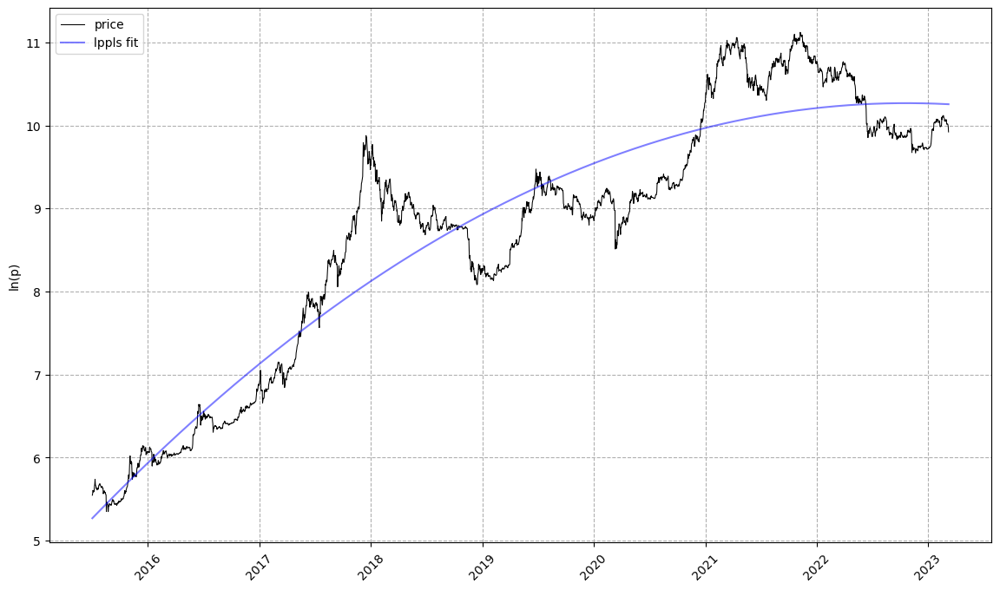

In [7]:
# read example dataset into df 
data = btc_close

# convert time to ordinal
time = [pd.Timestamp.toordinal(dt.strptime(t1, '%Y-%m-%d')) for t1 in data.index]

# create list of observation data
price = np.log(data.values)

# create observations array (expected format for LPPLS observations)
observations = np.array([time, price])

# set the max number for searches to perform before giving-up
# the literature suggests 25
MAX_SEARCHES = 25

# instantiate a new LPPLS model with dataset
lppls_model = lppls.LPPLS(observations=observations)

# fit the model to the data and get back the params
tc, m, w, a, b, c, c1, c2, O, D = lppls_model.fit(MAX_SEARCHES)

# visualize the fit
lppls_model.plot_fit()

100%|██████████████████████████████████████████████████████████████████████████████| 2718/2718 [05:02<00:00,  8.99it/s]


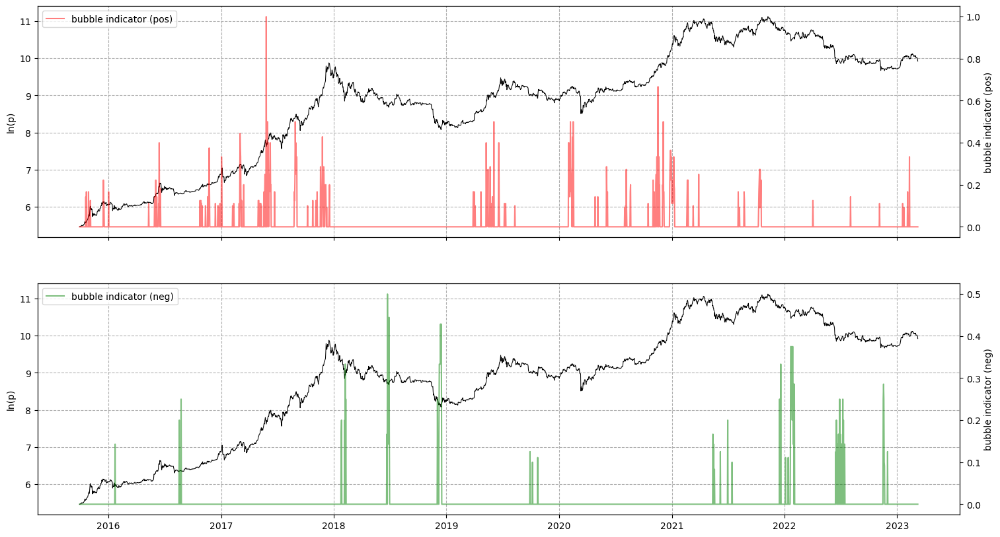

In [8]:
# compute the confidence indicator
# define custom filter condition
filter_conditions_config = [
    {'condition_1':[
        (0,0.2), # tc_range
        (0.01,0.99), # m_range
        (2,25), # w_range
        (2.5), # O_min
        (0.15), # D_min
    ]},]

res = lppls_model.mp_compute_nested_fits(
        workers=8,
        window_size=90,
        smallest_window_size=30,
        outer_increment=1,
        inner_increment=5,
        max_searches=25,
        filter_conditions_config=filter_conditions_config)

lppls_model.plot_confidence_indicators(res)

In [9]:
indicator = lppls_model.compute_indicators(res)

In [10]:
#indicator.to_csv('C:/DJ Cap/Data/LPPS', index=True)

In [11]:
#indicator = pd.read_csv('LPPS')

In [12]:
#turning the idicataors into signals (just for plot)
_, _, _, y_test = train_test_split(features,label, test_size=0.20, shuffle=False) #just to get the length of test set
n = len(y_test)
real_pos_conf = indicator['pos_conf'][len(indicator['pos_conf'])-n:]
trading_signal = np.array(real_pos_conf)
lppls_sig = []
for i in range(0,len(real_pos_conf)):
    if trading_signal[i] > 0:
        lppls_sig.append(1)
    else:
        lppls_sig.append(0)

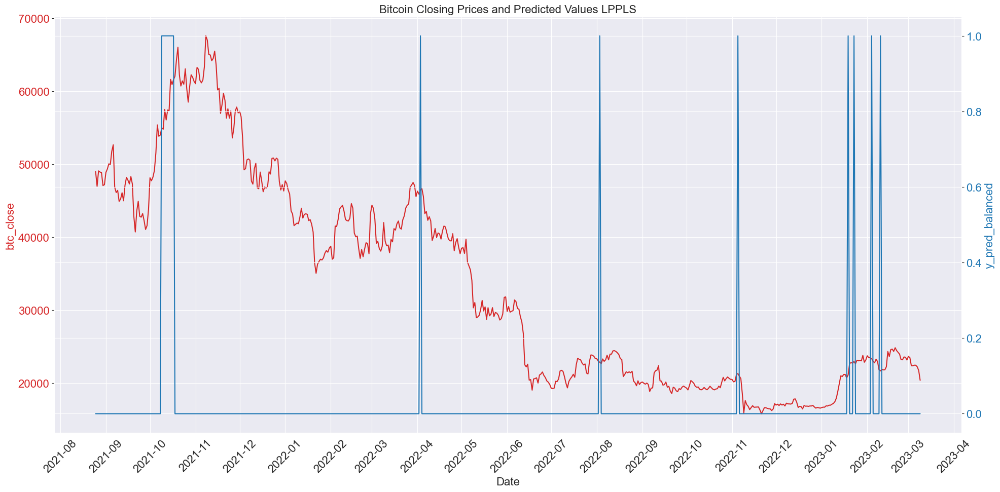

In [101]:
#Data
data = btc_close
y_pred_lppls_plot = pd.DataFrame(lppls_sig)

# Slicing the data DataFrame
data = data[len(data)-len(y_test):]

# Setting the index of the y_pred_balanced DataFrame to be the same as data
y_pred_lppls_plot.index = data.index

# Combine the two DataFrames
combined_df = pd.concat([data, y_pred_lppls_plot], axis=1)

# column names
combined_df.columns = ['btc_close', 'y_pred_lppls_plot']

combined_df.index = pd.to_datetime(combined_df.index)

# Schriftgröße einstellen
plt.rcParams['font.size'] = 16

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('btc_close', color=color)
ax1.plot(combined_df.index, combined_df['btc_close'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('y_pred_balanced', color=color)
ax2.plot(combined_df.index, combined_df['y_pred_lppls_plot'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Set major ticks format
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Add title
ax1.set_title('Bitcoin Closing Prices and Predicted Values LPPLS',fontsize=16)

# Rotate the x-axis labels
for label in ax1.get_xticklabels():
    label.set_rotation(45)

fig.tight_layout()
plt.show()


# 3. Correlation Plot

In [14]:
# Concatenate the features and the target variable into a single DataFrame
corr_dat = pd.concat([features, label], axis=1)

# Rename the target column to 'peak_indicator'
#corr_dat.rename(columns={'Signal': 'peak_indicator'}, inplace=True)

# Calculate the correlation matrix
correlation_matrix = corr_dat.corr(method='pearson')

# Get the correlation values for the target variable (peak_indicator)
correlation_with_target = correlation_matrix['Pred_Signal'].sort_values(ascending=False)

# Remove the peak_indicator itself from the list
correlation_with_target = correlation_with_target.drop('Pred_Signal')

# Print the correlation values for each feature
print(correlation_with_target)


ROC                                 0.363025
RSI                                 0.345816
K_percent                           0.283518
MACD                                0.211718
Log_Returns                         0.144702
Volume_change                       0.031101
SP_GSCI_Gold_Tot_Ret                0.025532
wiki                                0.025067
btc_no_transactions_change          0.015697
vix_change                          0.012016
hash_rate_mean_pct_change           0.011967
SP_Global_BMI_Tot_Ret               0.011263
volume_mined_sum_pct_change         0.010117
SP_GSCI_Energy_Tot_Ret              0.006789
Nom_Broad_USD_Index_inter_change   -0.017504
fed_fund_eff_rate                  -0.053724
GEPUPPP                            -0.122625
vix                                -0.177177
Name: Pred_Signal, dtype: float64


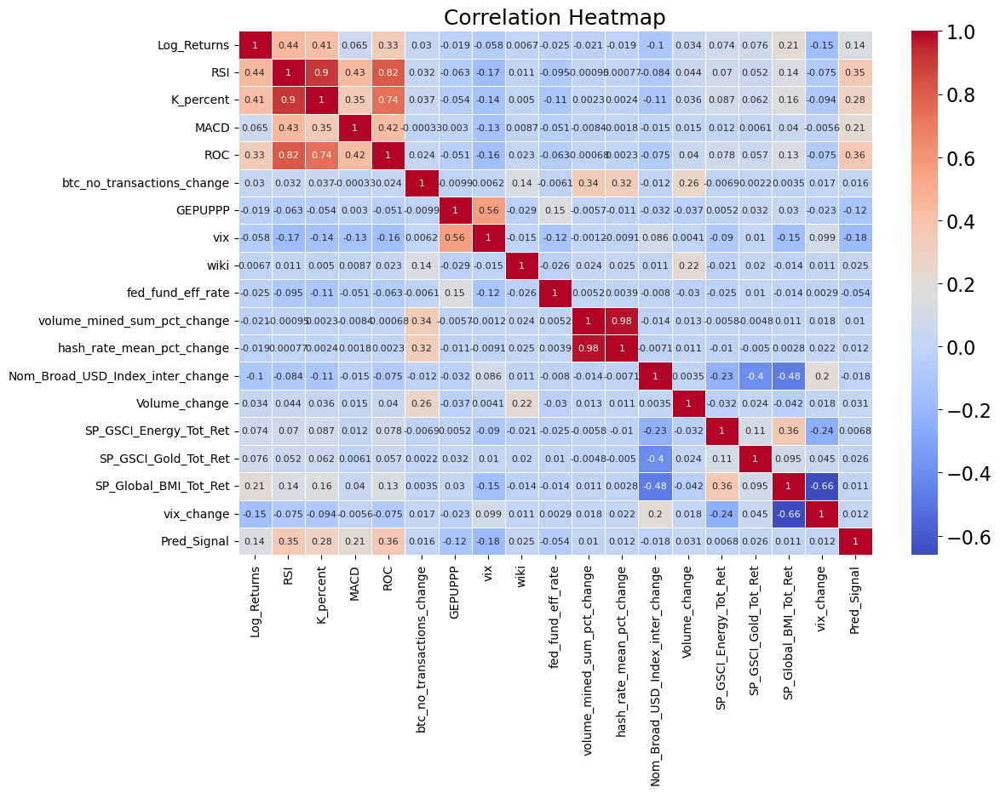

In [15]:
# Create a heatmap using Seaborn with bigger font size
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, annot_kws={"size": 8})

# Set the title of the heatmap
plt.title('Correlation Heatmap', fontsize=18)

# Set the font size for the axes labels
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Rotate the x-axis labels to be horizontal
plt.xticks(rotation=90)

# Show the plot
plt.show()


In [16]:
# Find the features with a correlation greater than 0.5:
highly_correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.4:
            colname = correlation_matrix.columns[i]
            highly_correlated_features.add(colname)

# Exclude 'peak_indicator' from highly_correlated_features
if 'peak_indicator' in highly_correlated_features:
    highly_correlated_features.remove('peak_indicator')


In [17]:
highly_correlated_features

{'K_percent',
 'MACD',
 'ROC',
 'RSI',
 'SP_GSCI_Gold_Tot_Ret',
 'SP_Global_BMI_Tot_Ret',
 'hash_rate_mean_pct_change',
 'vix',
 'vix_change'}

In [18]:
#Remove the highly correlated features from the DataFrame:
#old features: hash_rate_mean_pct_change,Nom_Broad_USD_Index_inter,volume_mined_sum_pct_change,fed_fund_eff_rate
# wiki,vix,Log_Returns,stoch_ostzillator,volume_sum_change
# 	Log_Returns 	K_percent 	ROC 	GEPUPPP 	wiki 	Nom_Broad_USD_Index_inter_change 	vix_change

features_filtered = features.drop(columns=['ROC','MACD','vix_change','fed_fund_eff_rate','SP_GSCI_Gold_Tot_Ret','RSI','SP_Global_BMI_Tot_Ret','btc_no_transactions_change','volume_mined_sum_pct_change','vix','SP_GSCI_Energy_Tot_Ret'])

features_filtered

,Log_Returns,K_percent,GEPUPPP,wiki,hash_rate_mean_pct_change,Nom_Broad_USD_Index_inter_change,Volume_change
1,0.003611,58.072117,128.857764,-0.152520,0.037984,5.231006e-04,-0.116839
2,0.017594,74.616325,128.857764,0.077043,-0.045281,5.228271e-04,-0.179334
3,0.041399,92.404976,128.857764,-0.028501,-0.083265,5.225539e-04,1.826823
4,-0.010659,77.353806,128.857764,0.180741,0.278871,5.222810e-04,0.113205
5,-0.010549,69.735815,128.857764,0.093248,-0.255988,6.073685e-03,-0.412924
...,...,...,...,...,...,...,...
2803,0.003669,8.078675,264.330834,-0.132182,0.024760,-7.126669e-04,0.192637
2804,-0.000257,7.882087,264.330834,0.144743,-0.169201,-7.131752e-04,0.303086
2805,-0.009406,8.142203,264.330834,0.076356,0.250673,7.807129e-03,0.311888
2806,-0.022837,0.350180,264.330834,-0.089201,-0.176546,-4.772233e-05,-0.010054


**Robust explanatory power of internal factors:**
- number of transactions, 
- number of bitcoins mined, 
- hash rates, 
- trading volume, 
- realized volatility of Bitcoin prices

**Public interest factors:**
- (Wikipedia views)
- global macroeconomic and financial factors (stock markets, energy markets, gold markets, investors’ 
  fear gauge
- economic policy uncertainty
- effective federal funds rate
- trade-weighted US dollar index


# 3. Building ML Models

## 3.1 Checking the data split. To see if we split the data correctly

In [19]:
#split in train and test data

X_train, X_test, y_train, y_test = train_test_split(features_filtered,label, test_size=0.20, shuffle=False)

# Split the data in a 80%, 20% proportion
print('Features lenght = ',len(features_filtered))
print('Label lenght = ',len(label))
print()
print('X_train lenght = ',len(X_train))
print('y_train lenght = ',len(y_train))
print('X_test lenght = ',len(X_test))
print('y_test lenght = ',len(y_test))

print('Backtesting x = ',len(X_train)+len(X_test))
print('Backtesting y = ',len(y_train)+len(y_test))

Features lenght =  2807
Label lenght =  2807

X_train lenght =  2245
y_train lenght =  2245
X_test lenght =  562
y_test lenght =  562
Backtesting x =  2807
Backtesting y =  2807


# 3.2 Building the XGBoost Model

In [20]:
#Source for Parameters: https://xgboost.readthedocs.io/en/stable/parameter.html

def xgboost_classification_balanced(features, labels, test_size=int):
    # Split the dataset into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=test_size, shuffle=False)

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Apply ADASYN to balance the dataset
    adasyn = ADASYN(random_state=8)
    X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train, np.ravel(y_train))

    # Number of trees in random forest
    n_estimators = [int(x) for x in np.linspace(start=10, stop=2000, num=20)]

    # Maximum number of levels in tree
    max_depth = [int(x) for x in np.linspace(1, 301, num=10)]
    max_depth.append(None)

    # Step size shrinkage used in update to prevents overfitting.
    learning_rate = [0.001, 0.01, 0.1, 1]

    # Minimum number of samples required at each leaf node
    min_samples_leaf = list(range(1, 301,5))
    
    # min_child_weight range: [0,∞]
    min_child_weight = np.arange(0, 1, 0.05).tolist()
    
    #Subsample: Subsample ratio of the training instances.
    subsample = np.arange(0, 1.01, 0.05).tolist()
    
    #colsample_bytree: is the subsample ratio of columns when constructing each tree. 
    colsample_bytree = np.arange(0.01, 1.01, 0.05).tolist()
    
    #scale_pos_weight: label wheights
    neg_instances = np.sum(y_train_resampled == 0) #class 0
    pos_instances = np.sum(y_train_resampled == 1) #class 1
    scale_pos_weight_value = neg_instances / pos_instances
    scale_pos_weight = [scale_pos_weight_value]

    
    #gamma:Minimum loss reduction required to make a further partition on a leaf node of the tree.
    gamma = [i/10.0 for i in range(0,5)]

    #regaular alpha reg_alpha provides l1 regularization to the weight, higher values result in more conservative models
    #reg_alpha =  [1e-5, 1e-2, 0.1, 1, 10, 100]
    
    ## reg_lambda provides l2 regularization to the weight, higher values result in more conservative models
    reg_lambda = [1e-5, 1e-2, 0.1, 1, 10, 100]
    
    #valuation metrics for validation data
    eval_metric = ['auc','rmsle','rmse','merror'] 
    
    #objective: Specify the learning task and the corresponding learning objective
    objective = ['binary:logistic'] # we tested also this:'binary:logitraw','binary:hinge' 
                                    # but binary:logistic was better
    
    # Grid search parameters:
    # https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
    
    params = {
        'objective': objective,
        'learning_rate': learning_rate,
        'max_depth': max_depth,
        'min_child_weight': min_child_weight,
        'subsample': subsample,
        'colsample_bytree': colsample_bytree,
        'n_estimators': n_estimators,
        'gamma': gamma,
        'reg_lambda': reg_lambda, #'reg_alpha':reg_alpha,
        'scale_pos_weight': scale_pos_weight,
        'eval_metric': eval_metric
    }
    
    
    # First create the base model to tune    
    xgb_model = xgb.XGBClassifier(random_state=8)
    
    # Define the number of folds
    n_splits = 10
    
    # Create the cross-validation object
    cv = StratifiedKFold(n_splits=n_splits, shuffle=False)
    
    #Random search of parameters, using 10 folds StratifiedKFold cross validation,
    xgb_random = RandomizedSearchCV(estimator=xgb_model, param_distributions=params, n_iter=250,
                                   cv=cv, verbose=1, random_state=8, n_jobs=-1, scoring='balanced_accuracy')
    
    # Fit the random search model
    xgb_random.fit(X_train_resampled, np.ravel(y_train_resampled))
    
    # Get the best parameters from the RandomizedSearchCV
    best_params = xgb_random.best_params_
    
    # Create a XGBoost Classifier with the Hyperparameters from the Tuning
    xgb_clf = xgb.XGBClassifier(**best_params, random_state=8)

    # Fit the data to the model
    xgb_clf.fit(X_train_resampled, np.ravel(y_train_resampled))
    
    # Make predictions
    y_pred = xgb_clf.predict(X_test)

    return y_pred, best_params, xgb_clf, y_test, X_train_resampled, y_train_resampled


In [21]:
y_pred_xg, best_params, xgb_clf, y_test, X_train_resampled, y_train_resampled = xgboost_classification_balanced(features_filtered, label, test_size=0.2)

Fitting 10 folds for each of 250 candidates, totalling 2500 fits


In [22]:
#Storing the results as .csv
#y_pred_xg_backup = pd.DataFrame(y_pred_xg)
#y_pred_xg_backup.to_csv('XGBOOST_PRED_SIGNALS')

In [23]:
#y_pred_xg = pd.read_csv('XGBOOST_PRED_SIGNALS')

In [24]:
best_params

{'subsample': 0.2,
 'scale_pos_weight': 1.005050505050505,
 'reg_lambda': 1e-05,
 'objective': 'binary:logistic',
 'n_estimators': 2000,
 'min_child_weight': 0.15000000000000002,
 'max_depth': 234,
 'learning_rate': 0.01,
 'gamma': 0.3,
 'eval_metric': 'auc',
 'colsample_bytree': 0.8600000000000001}

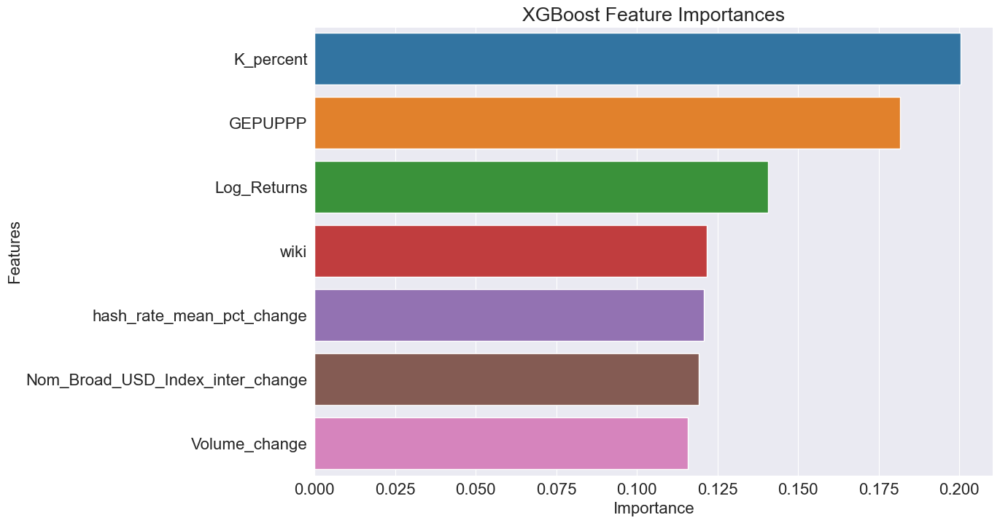

In [89]:
#XGBoost Features Importance
importance = xgb_clf.feature_importances_
importance_df = pd.DataFrame({"Features": features_filtered.columns, "Importances": importance})
importance_df = importance_df.sort_values('Importances', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importances', y='Features', data=importance_df)
plt.title('XGBoost Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

In [27]:
importance_df

,Features,Importances
1,K_percent,0.200471
2,GEPUPPP,0.181589
0,Log_Returns,0.140580
3,wiki,0.121606
4,hash_rate_mean_pct_change,0.120771
5,Nom_Broad_USD_Index_inter_change,0.119214
6,Volume_change,0.115768


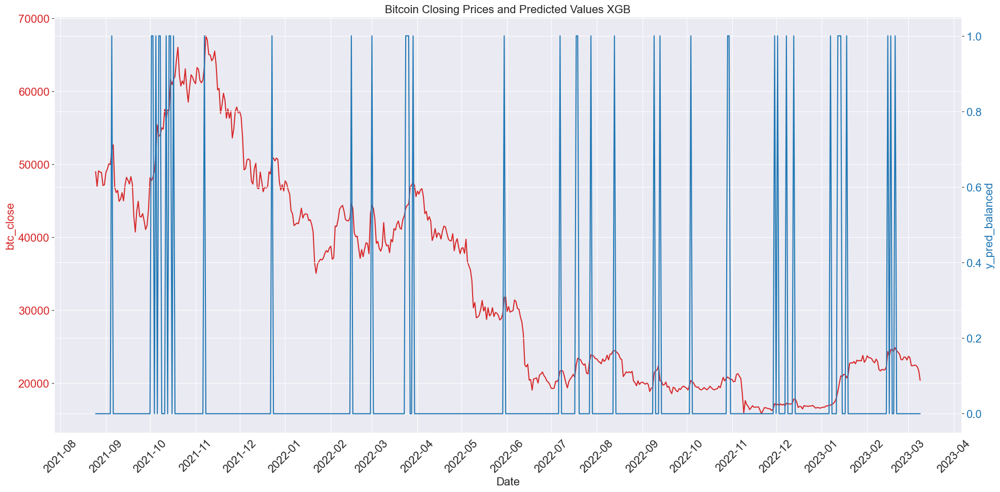

In [100]:
#Data
data = btc_close
y_pred_xg_plot = pd.DataFrame(y_pred_xg)

# Slicing the data DataFrame
data = data[len(data)-len(y_test):]

# Setting the index of the y_pred_balanced DataFrame to be the same as data
y_pred_xg_plot.index = data.index

# Combine the two DataFrames
combined_df = pd.concat([data, y_pred_xg_plot], axis=1)

# column names
combined_df.columns = ['btc_close', 'y_pred_xg_plot']

combined_df.index = pd.to_datetime(combined_df.index)

# Schriftgröße einstellen
plt.rcParams['font.size'] = 16

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('btc_close', color=color)
ax1.plot(combined_df.index, combined_df['btc_close'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('y_pred_balanced', color=color)
ax2.plot(combined_df.index, combined_df['y_pred_xg_plot'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Set major ticks format
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Add title
ax1.set_title('Bitcoin Closing Prices and Predicted Values XGB',fontsize=16)

# Rotate the x-axis labels
for label in ax1.get_xticklabels():
    label.set_rotation(45)

fig.tight_layout()
plt.show()


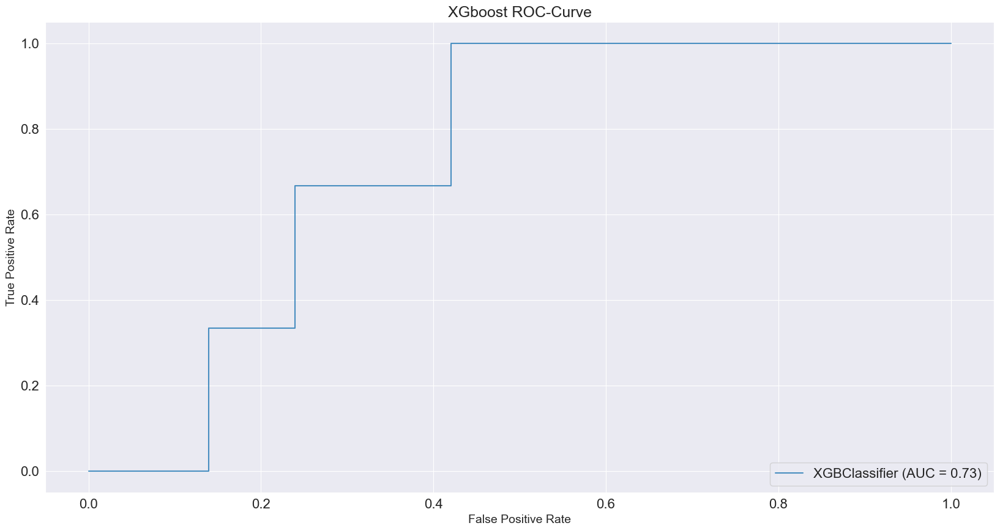

In [88]:
# Create an ROC Curve plot XGB
rfc_disp = RocCurveDisplay.from_estimator(xgb_clf, X_test, y_test, alpha = 0.8) 
plt.title('XGboost ROC-Curve', fontsize=18)
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.show()


In [30]:
# Print the Accuracy (Hit Ratio) of our Model.
print('Correct Prediction (Hit Ratio) % : ', accuracy_score(y_test, y_pred_xg, normalize = True) * 100.0)

# Checking performance our model with AUC Score.
y_pred_proba = xgb_clf.predict_proba(X_test)[:, 1]  # Get probabilities for the positive class
auc = roc_auc_score(y_test, y_pred_proba)
print('Area under the curve:', auc)


# Get the root mean squared error (RMSE)
print('RMSE = ' , rmse_metric(y_test, y_pred_xg))
# Don't forget the worst value in this case is 1! 

print('MAE = ' , mae_metric(y_test, y_pred_xg))
 

Correct Prediction (Hit Ratio) % :  92.52669039145907
Area under the curve: 0.7334525939177102
RMSE =  0.27337354679158193
MAE =  0.07473309608540925


In [31]:
#Classifiaction Report

# Build a classifcation report
report = classification_report(y_true = y_test, y_pred = y_pred_xg, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df = pd.DataFrame(report).transpose() 
report_df

,precision,recall,f1-score,support
0.0,0.996161,0.928444,0.961111,559.000000
1.0,0.024390,0.333333,0.045455,3.000000
accuracy,0.925267,0.925267,0.925267,0.925267
macro avg,0.510276,0.630888,0.503283,562.000000
weighted avg,0.990974,0.925267,0.956223,562.000000


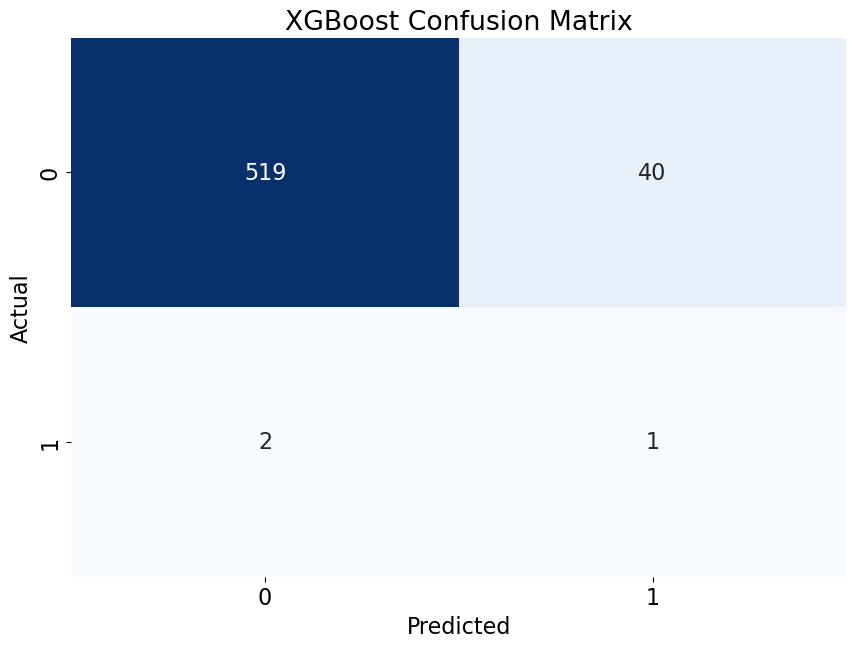

In [32]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_xg)

# Create a heatmap using seaborn
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,)

# Add labels and title
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('XGBoost Confusion Matrix')

# Display the plot
plt.show()


# 3.2.1 Robustness check XGB

In [33]:
# k-fold cross validation evaluation of xgboost model
kfold = 20
results = cross_val_score(xgb_clf, X_train_resampled, y_train_resampled, cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 85.82% (7.02%)


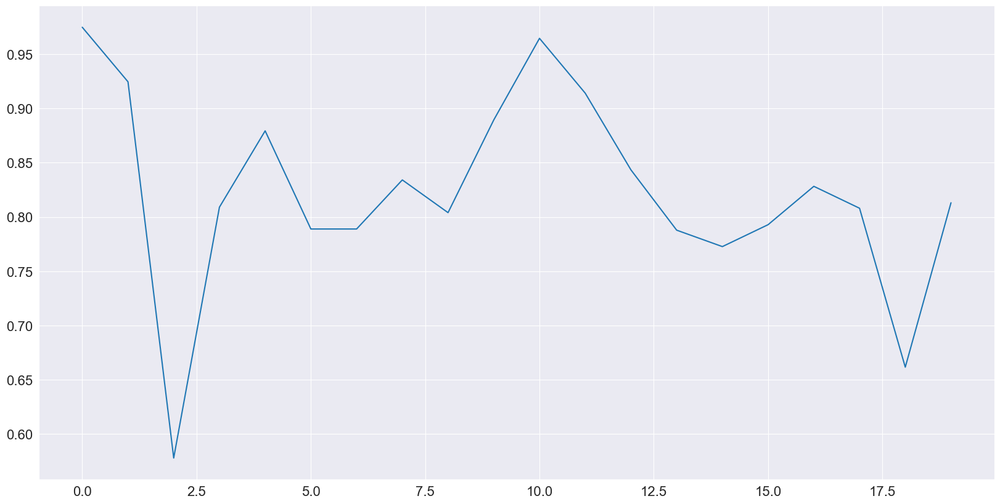

In [87]:
plt.plot(results);

# 3.3 Building RF Model

In [35]:
def random_forest_classification_balanced(features, labels, test_size=int):
    # Split the dataset into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=test_size, shuffle=False)

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Apply ADASYN to balance the dataset
    adasyn = ADASYN(random_state=8)
    X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train, np.ravel(y_train))

    # Number of trees in random forest
    n_estimators = [int(x) for x in np.linspace(start=10, stop=2000, num=10)]

    # Number of features to consider at every split
    max_features = ['sqrt', 'log2']

    # Maximum number of levels in tree
    max_depth = [int(x) for x in np.linspace(1, 301, num=11)]
    max_depth.append(None)

    # Minimum number of samples required to split a node
    min_samples_split = list(range(2, 80))

    # Minimum number of samples required at each leaf node
    min_samples_leaf = list(range(1, 80))

    # Criterion
    criterion = ['gini', 'entropy']

    # Bootstrap grid
    bootstrap = [True]
    
    #class weights
    class_weight=['balanced']

    # Create the random grid
    random_grid = {'class_weight': class_weight,
                   'n_estimators': n_estimators,
                   'max_features': max_features,
                   'max_depth': max_depth,
                   'min_samples_split': min_samples_split,
                   'min_samples_leaf': min_samples_leaf,
                   'criterion': criterion,
                   'bootstrap': bootstrap}

    # First create the base model to tune
    rf = BalancedRandomForestClassifier()

    # Define the number of folds
    n_splits = 10

    # Create the cross-validation object
    cv = StratifiedKFold(n_splits=n_splits, shuffle=False) # nach papaer suchen welche cv verwendet werden in time series

    # Random search of parameters, using 2 fold cross validation,
    # search across 50 different combinations, and use 3 available cores
    rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid, n_iter=250,
                                   cv=cv, verbose=1, random_state=8, n_jobs=-1, scoring='balanced_accuracy')
    
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter

    # Fit the random search model
    rf_random.fit(X_train_resampled, np.ravel(y_train_resampled))
    
    
    # Get the best parameters from the RandomizedSearchCV
    param = rf_random.best_params_
    
    

    # Create a Random Forest Regressor with the Hyperparameters from the Tuning
    rand_frst_clf = BalancedRandomForestClassifier(oob_score=True,
                                           class_weight='balanced',
                                           n_estimators=param['n_estimators'],
                                           min_samples_split=param['min_samples_split'],
                                           min_samples_leaf=param['min_samples_leaf'],
                                           max_features=param['max_features'],
                                           max_depth=param['max_depth'],
                                           criterion=param['criterion'],
                                           bootstrap=param['bootstrap'],
                                           random_state=8)

    # Fit the data to the model
    rand_frst_clf.fit(X_train_resampled, np.ravel(y_train_resampled))

   
    
    # Make predictions
    y_pred = rand_frst_clf.predict(X_test)

    # This is the Output command to see the best Parameters
    param = rf_random.best_params_

    return y_pred, param, rand_frst_clf,y_test,X_train_resampled, y_train_resampled


In [36]:
# Warinings because of old py version
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn")
from sklearn.utils.parallel import delayed



# Using BalancedRandomForestClassifier
y_pred_balanced, param_balanced, rand_frst_clf_balanced, y_test,X_train_resampled, y_train_resampled = random_forest_classification_balanced(features_filtered, 
                                                                                                        label, 
                                                                                                        test_size = 0.2)
                                                                                                          


Fitting 10 folds for each of 250 candidates, totalling 2500 fits


C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureW

In [37]:
#storing the RF results
#y_pred_balanced_backup = pd.DataFrame(y_pred_balanced)
#y_pred_balanced_backup.to_csv('RF_PRED_SIGNALS.csv')

In [38]:
#y_pred_balanced = pd.read_csv('RF_PRED_SIGNALS.csv')

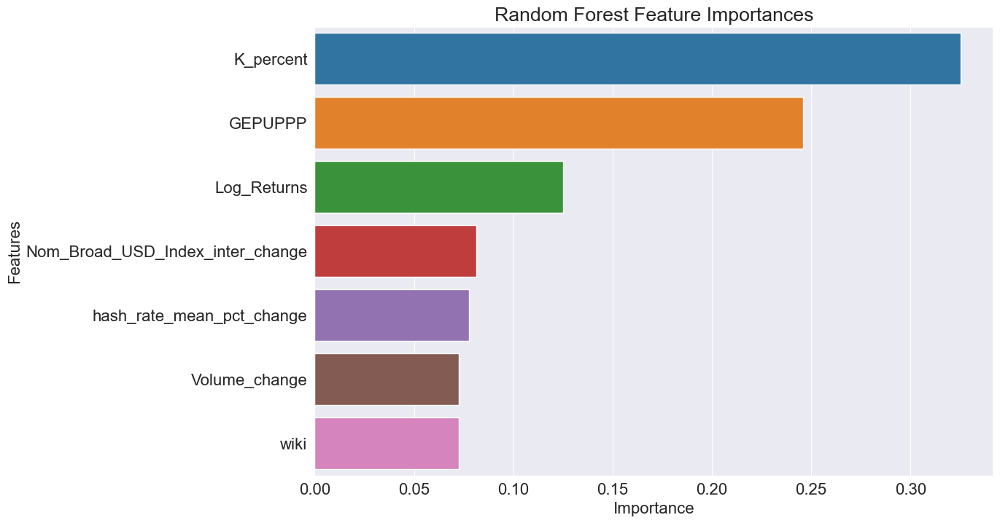

In [86]:
#Random Forest Features Importance
importance = rand_frst_clf_balanced.feature_importances_
importance_df = pd.DataFrame({"Features": features_filtered.columns, "Importances": importance})
importance_df = importance_df.sort_values('Importances', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importances', y='Features', data=importance_df)
plt.title('Random Forest Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

In [40]:
importance_df

,Features,Importances
1,K_percent,0.325239
2,GEPUPPP,0.245714
0,Log_Returns,0.124955
5,Nom_Broad_USD_Index_inter_change,0.081524
4,hash_rate_mean_pct_change,0.077718
6,Volume_change,0.072457
3,wiki,0.072392


In [41]:
param_balanced

{'n_estimators': 1336,
 'min_samples_split': 23,
 'min_samples_leaf': 4,
 'max_features': 'log2',
 'max_depth': 121,
 'criterion': 'entropy',
 'class_weight': 'balanced',
 'bootstrap': True}

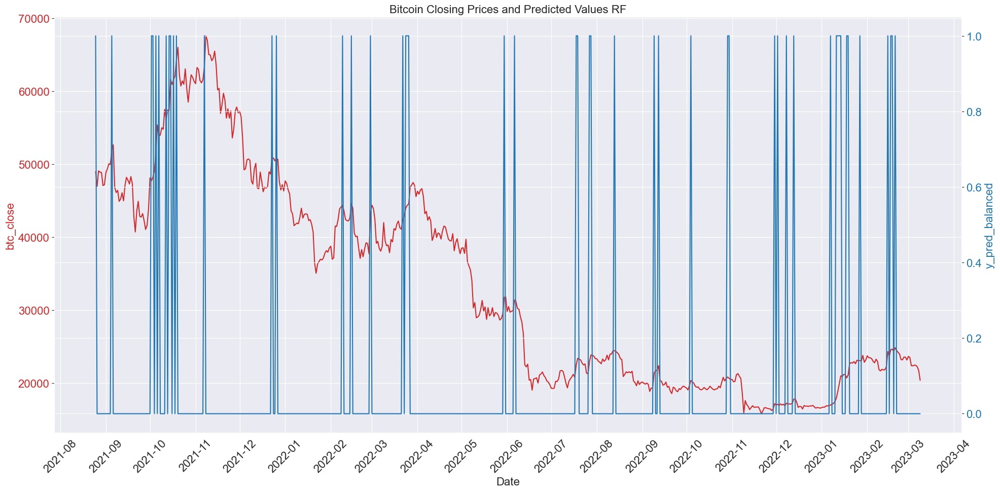

In [99]:
#Data
data = btc_close
y_pred_balanced = pd.DataFrame(y_pred_balanced)

# Slicing the data DataFrame
data = data[len(data)-len(y_test):]

# Setting the index of the y_pred_balanced DataFrame to be the same as data
y_pred_balanced.index = data.index

# Combine the two DataFrames
combined_df = pd.concat([data, y_pred_balanced], axis=1)

# column names
combined_df.columns = ['btc_close', 'y_pred_balanced']

combined_df.index = pd.to_datetime(combined_df.index)

# Setting the font size
plt.rcParams['font.size'] = 16

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('btc_close', color=color)
ax1.plot(combined_df.index, combined_df['btc_close'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('y_pred_balanced', color=color)
ax2.plot(combined_df.index, combined_df['y_pred_balanced'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Set major ticks format
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Add title
ax1.set_title('Bitcoin Closing Prices and Predicted Values RF', fontsize=16)

# Rotate the x-axis labels
for label in ax1.get_xticklabels():
    label.set_rotation(45)

fig.tight_layout()
plt.show()

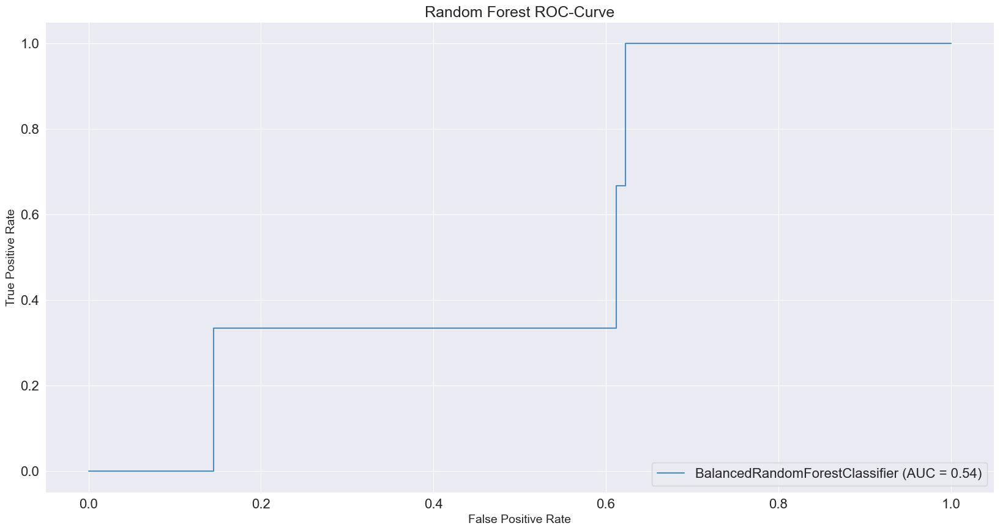

In [94]:
# Create an ROC Curve plot.
rfc_disp = RocCurveDisplay.from_estimator(rand_frst_clf_balanced, X_test, y_test, alpha = 0.8) 
plt.title('Random Forest ROC-Curve', fontsize=18)
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.show()


In [45]:
# Print the Accuracy (Hit Ratio) of our Model.
print('Correct Prediction (Hit Ratio) % : ', accuracy_score(y_test, y_pred, normalize = True) * 100.0)

# Checking performance our model with AUC Score.
y_pred_proba = rand_frst_clf_balanced.predict_proba(X_test)[:, 1]  # Get probabilities for the positive class
auc = roc_auc_score(y_test, y_pred_proba)
print('Area under the curve:', auc)

# Get the root mean squared error (RMSE)
print('RMSE = ' , rmse_metric(y_test, y_pred))
# Don't forget the worst value in this case is 1! 

print('MAE = ' , mae_metric(y_test, y_pred))
 

Correct Prediction (Hit Ratio) % :  91.45907473309609
Area under the curve: 0.5402504472271914
RMSE =  0.2922486144860898
MAE =  0.08540925266903915


In [46]:
#Classifiaction Report

# Build a classifcation report
report = classification_report(y_true = y_test, y_pred = y_pred, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df = pd.DataFrame(report).transpose() 
report_df

,precision,recall,f1-score,support
0.0,0.998051,0.915921,0.955224,559.000000
1.0,0.040816,0.666667,0.076923,3.000000
accuracy,0.914591,0.914591,0.914591,0.914591
macro avg,0.519434,0.791294,0.516073,562.000000
weighted avg,0.992941,0.914591,0.950535,562.000000


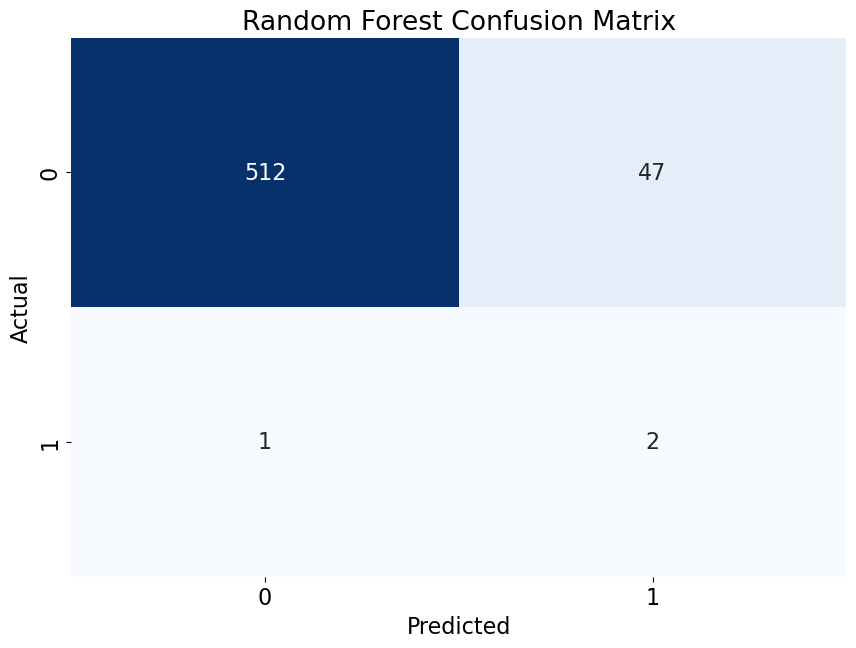

In [47]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap using seaborn
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)

# Add labels and title
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Random Forest Confusion Matrix')

# Display the plot
plt.show()


## 3.3.1 Robustness Check RF

In [48]:
#k-fold cross validation evaluation of RF model
kfold = 20
results = cross_val_score(rand_frst_clf_balanced, X_train_resampled, np.ravel(y_train_resampled), cv=kfold)


C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureW

In [49]:
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 82.29% (9.05%)


# 3.4 Creating the tables of predicted signals

In [50]:
y_pred_balanced = pd.DataFrame(y_pred_balanced)
y_pred_balanced = y_pred_balanced.astype(int) #float to integer
index = y_pred_balanced.index
y_pred_xg = pd.DataFrame(y_pred_xg)
y_pred_xg.index = index

In [51]:
#get min and max index 
min_index = y_pred_balanced.index.min()
max_index = y_pred_balanced.index.max()
dates_df = pd.DataFrame(date)

#filter for the test length dates
filtered_dates_df = dates_df.loc[(len(features)+1)-len(y_test):]#dates_df.loc[min_index:max_index]
filtered_dates_df.index = filtered_dates_df['Date']
filtered_dates_df = filtered_dates_df.drop('Date',axis = 1)

#set the index
y_pred_balanced.index = filtered_dates_df.index
y_pred_xg.index = filtered_dates_df.index

In [52]:
def create_signal_dataframe(df):
    """
    This function takes a DataFrame with a binary signal column and returns a new DataFrame containing
    information about each contiguous signal period, including the start date, peak date, and duration.
    """
    
    start_date = None
    duration = 0
    signal_data = []

    # Iterate through the rows of the input DataFrame
    for index, row in df.iterrows():
        signal = row[0]

        # If the current row has a signal and there is no ongoing signal period, start a new signal period
        if signal and start_date is None:
            start_date = index
            duration = 1
        # If the current row has a signal and there is an ongoing signal period, increment the duration
        elif signal and start_date is not None:
            duration += 1
        # If the current row does not have a signal and there is an ongoing signal period, end the signal period
        elif not signal and start_date is not None:
            peak_date = start_date + pd.to_timedelta(duration-1, unit='D')
            signal_data.append([start_date, peak_date, duration])
            start_date = None
            duration = 0

    # If there's an ongoing signal at the end of the DataFrame, add it to the signal_data list
    if start_date is not None:
        peak_date = start_date + pd.to_timedelta(duration-1, unit='D')
        signal_data.append([start_date, peak_date, duration])

    # Create a new DataFrame with the signal_data list and column names "Start", "Peak", and "Duration"
    result_df = pd.DataFrame(signal_data, columns=["Start", "Peak", "Duration"])
    return result_df


In [53]:
y_pred_balanced.index = pd.to_datetime(y_pred_balanced.index)
signal_y_pred_balanced_df = create_signal_dataframe(y_pred_balanced)
signal_y_pred_balanced_df

,Start,Peak,Duration
0,2021-08-25,2021-08-25,1
1,2021-09-05,2021-09-05,1
2,2021-10-02,2021-10-03,2
3,2021-10-05,2021-10-05,1
4,2021-10-07,2021-10-07,1
5,2021-10-12,2021-10-12,1
6,2021-10-14,2021-10-15,2
7,2021-10-17,2021-10-17,1
8,2021-10-19,2021-10-19,1
9,2021-11-07,2021-11-07,1


In [54]:
y_pred_xg.index = pd.to_datetime(y_pred_xg.index)
signal_y_pred_xg_df = create_signal_dataframe(y_pred_xg)
signal_y_pred_xg_df

,Start,Peak,Duration
0,2021-09-05,2021-09-05,1
1,2021-10-02,2021-10-03,2
2,2021-10-05,2021-10-05,1
3,2021-10-07,2021-10-08,2
4,2021-10-12,2021-10-12,1
5,2021-10-14,2021-10-15,2
6,2021-10-17,2021-10-17,1
7,2021-11-07,2021-11-07,1
8,2021-12-23,2021-12-23,1
9,2022-02-15,2022-02-15,1


In [55]:
lppls_sig = pd.DataFrame(lppls_sig)
lppls_sig.index = pd.to_datetime(y_pred_xg.index)
signal_y_pred_lppls_df = create_signal_dataframe(lppls_sig)
signal_y_pred_lppls_df

,Start,Peak,Duration
0,2021-10-09,2021-10-17,9
1,2022-04-03,2022-04-03,1
2,2022-08-03,2022-08-03,1
3,2022-11-05,2022-11-05,1
4,2023-01-19,2023-01-19,1
5,2023-01-23,2023-01-23,1
6,2023-02-04,2023-02-04,1
7,2023-02-10,2023-02-10,1


In [56]:
#LPPLS Bubbels characteristics lppls_sig
mean_duration_lppls = np.mean(signal_y_pred_lppls_df['Duration'])
max_duration_lppls = np.max(signal_y_pred_lppls_df['Duration'])
bubbels_count_lppls = len(signal_y_pred_lppls_df)

# Convert Start column to datetime if it's not
signal_y_pred_lppls_df['Start'] = pd.to_datetime(signal_y_pred_lppls_df['Start'])

# Calculate the difference between the current and the next bubble
signal_y_pred_lppls_df['Period_Between_Bubbles'] = signal_y_pred_lppls_df['Start'].shift(-1) - signal_y_pred_lppls_df['Start']

# Compute the mean difference
mean_period_lppls = signal_y_pred_lppls_df['Period_Between_Bubbles'].mean()

In [58]:
#XGboost Bubbels characteristics
mean_duration_xg = np.mean(signal_y_pred_xg_df['Duration'])
max_duration_xg = np.max(signal_y_pred_xg_df['Duration'])
bubbels_count_xg = len(signal_y_pred_xg_df)

# Convert Start column to datetime if it's not
signal_y_pred_xg_df['Start'] = pd.to_datetime(signal_y_pred_xg_df['Start'])

# Calculate the difference between the current and the next bubble
signal_y_pred_xg_df['Period_Between_Bubbles'] = signal_y_pred_xg_df['Start'].shift(-1) - signal_y_pred_xg_df['Start']

# Compute the mean difference
mean_period_xg = signal_y_pred_xg_df['Period_Between_Bubbles'].mean()


In [60]:
#Random Forest Bubbels characteristics
mean_duration_rf = np.mean(signal_y_pred_balanced_df['Duration'])
max_duration_rf = np.max(signal_y_pred_balanced_df['Duration'])
bubbels_count_rf = len(signal_y_pred_balanced_df)
# Convert Start column to datetime if it's not
signal_y_pred_balanced_df['Start'] = pd.to_datetime(signal_y_pred_balanced_df['Start'])

# Calculate the difference between the current and the next bubble
signal_y_pred_balanced_df['Period_Between_Bubbles'] = signal_y_pred_balanced_df['Start'].shift(-1) - signal_y_pred_balanced_df['Start']

# Compute the mean difference
mean_period_rf = signal_y_pred_balanced_df['Period_Between_Bubbles'].mean()


In [104]:
# Predicted bubbel characteristics
tabel_characteristics = pd.DataFrame({
        'Model': ['Random Forest', 'XGBoost', 'LPPLS'],
        'Mean_Duration': [mean_duration_rf,mean_duration_xg,mean_duration_lppls],
        'Max_Duration': [max_duration_rf,max_duration_xg,max_duration_lppls],
        'Mean_Period_Between_Bubbles': [mean_period_rf,mean_period_xg,mean_period_lppls],
        'Number of Bubbels': [bubbels_count_rf,bubbels_count_xg,bubbels_count_lppls]
})

tabel_characteristics

,Model,Mean_Duration,Max_Duration,Mean_Period_Between_Bubbles,Number of Bubbels
0,Random Forest,1.324324,4,15 days 02:40:00,37
1,XGBoost,1.281250,3,17 days 04:38:42.580645161,32
2,LPPLS,2.000000,9,69 days 20:34:17.142857143,8


# 3.5 Trading 

In [62]:
#get the length for Test set
n = len(y_pred_balanced)
X = btc_close
X = X.pct_change().shift(-1) 
X = X[len(X)-n:]
y_pred = pd.DataFrame(y_pred_balanced)
X.index = y_pred.index


In [63]:
#Pred RF
# Transform 0,1 Signal in a -1,1 Signal
trading_signal = np.array(y_pred)
y1 = []
for i in range(0,len(y_pred)):
    if trading_signal[i] > 0:
        y1.append(1)
        
    else:
        y1.append(-1)

In [64]:
#long short random forest

perf1_rf = y1 * X

perf1_rf = perf1_rf.dropna()

trading_days_Y = len(y_test) 

perf_sharpe1 = np.sqrt(trading_days_Y) * np.mean(perf1_rf) / (np.sqrt(np.var(perf1_rf)))

In [65]:
#long short xgboost
y_pred_xg = pd.DataFrame(y_pred_xg)

# Transform 0,1 Signal in a -1,1 Signal
trading_signal = np.array(y_pred_xg)
y1 = []
for i in range(0,len(y_pred_xg)):
    if trading_signal[i] > 0:
        y1.append(1)
        
    else:
        y1.append(-1)

perf1_xg = y1 * X

perf1_xg = perf1_xg.dropna()

perf_sharpexg = np.sqrt(trading_days_Y) * np.mean(perf1_xg) / (np.sqrt(np.var(perf1_xg)))

In [66]:
#siGNAL With LPPLS
#Transform Signal in a -1,1 Signal

real_pos_conf = indicator['pos_conf'][len(indicator['pos_conf'])-n:]
trading_signal = np.array(real_pos_conf)
y2 = []
for i in range(0,len(real_pos_conf)):
    if trading_signal[i] > 0:
        y2.append(1)
    else:
        y2.append(-1)

In [67]:
#long short LPPS model
perf2 = y2 * X

perf2 = perf2.dropna()

perf_sharpe2 = np.sqrt(trading_days_Y) * np.mean(perf2) / (np.sqrt(np.var(perf2)))

In [68]:
#buy and hold
perf3 = X.dropna()

perf_sharpe3 = np.sqrt(trading_days_Y) * np.mean(perf3) / (np.sqrt(np.var(perf3)))

### Sharpe ratio report und statistics vode performance

In [70]:
#cummulative performance
rf_cum_perf = perf1_rf.cumsum()
xg_cum_perf = perf1_xg.cumsum()
lppls_cum_perf = perf2.cumsum() 
bh_cum_perf = perf3.cumsum() 

#returns
rf_ret = perf1_rf
xg_ret = perf1_xg
lppls_ret = perf2 
bh_ret = perf3 

# Create a dictionary with the return series
data = {
    "rf_ret": rf_ret,
    "xg_ret": xg_ret,
    "lppls_ret": lppls_ret,
    "bh_ret": bh_ret,
}

# Create a DataFrame from the dictionary
returns_df = pd.DataFrame(data)

# Calculate the volatility for each return series
volatility = returns_df.std() * np.sqrt(len(y_test))

#max drawdown
rf_md = max_drawdown(rf_ret)
xg_md = max_drawdown(xg_ret)
lppls_md = max_drawdown(lppls_ret)
bh_md = max_drawdown(bh_ret)

#sharpe Ratios
rf_sp = perf_sharpe1
xg_sp = perf_sharpexg
lppls_sp = perf_sharpe2
bh_sp = perf_sharpe3


# Create a dictionary with the data
performance_data = {
    "Strategy": ["Random Forest", "XGBoost", "LPPLS", "Buy & Hold"],
    "Cumulative Performance": [rf_cum_perf.iloc[-1], xg_cum_perf.iloc[-1], lppls_cum_perf.iloc[-1], bh_cum_perf.iloc[-1]],
    "Maximum Drawdown": [rf_md, xg_md, lppls_md, bh_md],
    "Volatility": [volatility[0],volatility[1],volatility[2],volatility[3]],
    "Sharpe Ratio": [rf_sp, xg_sp, lppls_sp, bh_sp],
}

# Create a DataFrame from the dictionary
table = pd.DataFrame(performance_data)

# Display the table
table

,Strategy,Cumulative Performance,Maximum Drawdown,Volatility,Sharpe Ratio
0,Random Forest,1.529683,0.307976,0.774811,1.979551
1,XGBoost,1.418699,0.305857,0.775188,1.835033
2,LPPLS,0.891528,0.337080,0.776592,1.151073
3,Buy & Hold,-0.572933,0.766346,0.777129,-0.739216


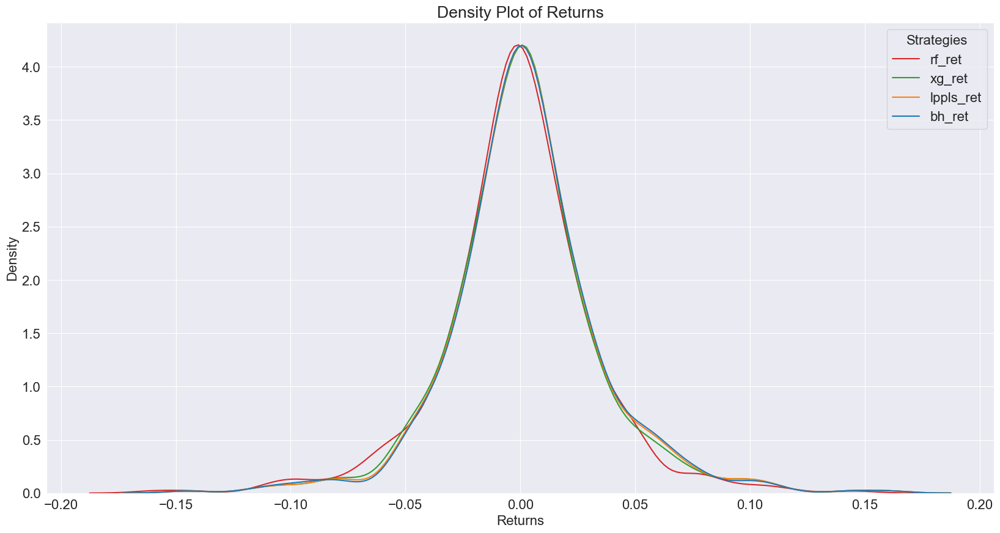

In [82]:
# Plot density returns
sns.kdeplot(data=returns_df)
plt.xlabel("Returns")
plt.ylabel("Density")
plt.legend(returns_df.columns, title="Strategies")
plt.title("Density Plot of Returns")
plt.show()

In [73]:
#calculate the cum ret
cum_ret = returns_df.cumsum()

# Define a dictionary with the old names as keys and new names as values
new_column_names = {
    "rf_ret": "Random Forest",
    "xg_ret": "XGBoost",
    "lppls_ret": "LPPLS",
    "bh_ret": "Buy & Hold"
}

# Use the rename function
cum_ret = cum_ret.rename(columns=new_column_names)

# Now your_df will have the new column names
cum_ret


,Random Forest,XGBoost,LPPLS,Buy & Hold
Date,,,,
2021-08-25,-0.041228,0.041228,0.041228,-0.041228
2021-08-26,-0.086315,-0.003858,-0.003858,0.003858
2021-08-27,-0.083129,-0.000673,-0.000673,0.000673
2021-08-28,-0.081645,0.000811,0.000811,-0.000811
2021-08-29,-0.045298,0.037159,0.037159,-0.037159
...,...,...,...,...
2023-03-04,1.435092,1.324108,0.796938,-0.478343
2023-03-05,1.435349,1.324365,0.797194,-0.478599
2023-03-06,1.444711,1.333727,0.806556,-0.487961


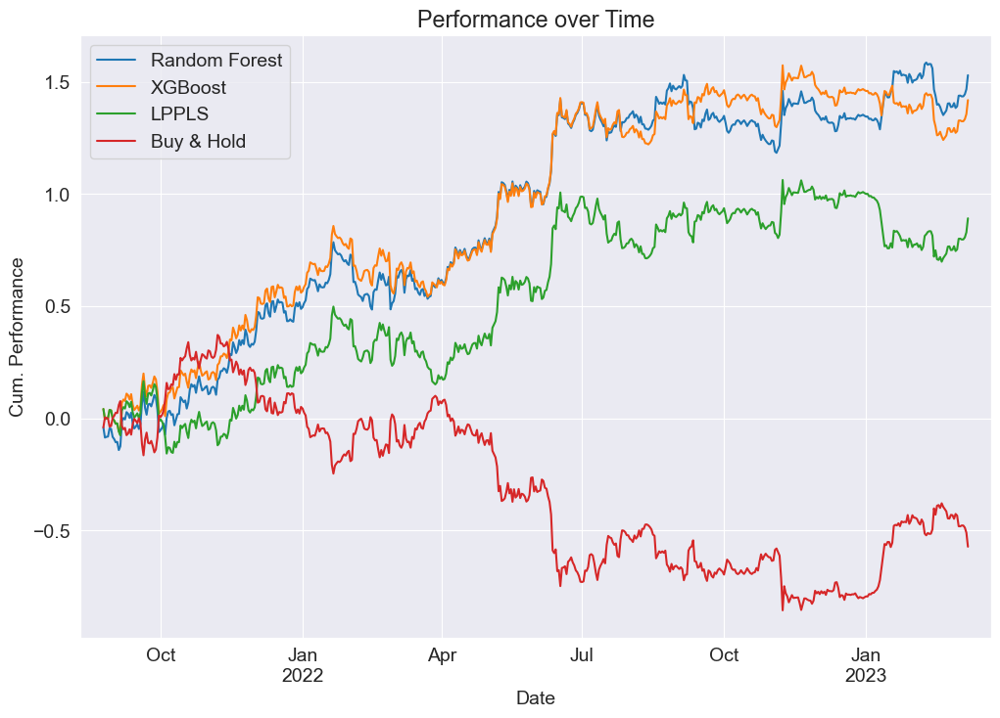

In [103]:
from matplotlib.dates import date2num
import datetime

# Register matplotlib converters.
register_matplotlib_converters()

# Setting the font size
plt.rcParams['font.size'] = 14

# Set the style of Seaborn
sns.set_style("darkgrid")

# Convert the index to DatetimeIndex
cum_ret.index = pd.to_datetime(cum_ret.index)

# Plot the data
cum_ret.plot(figsize=(12,8))

# Get current axis
ax = plt.gca()

# Extend x-axis limits
ax.set_xlim([cum_ret.index.min() - datetime.timedelta(days=15), cum_ret.index.max() + datetime.timedelta(days=15)])

plt.title('Performance over Time')
plt.xlabel('Date')
plt.ylabel('Cum. Performance')
plt.show()


*Bemerkung: wenn die modelkomplexität hoch ist, overfitting bei RF.-> Bei uns nicht der Fall*
